## Modeling for Troll Tweet Prediction

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import sklearn.cluster
import numpy as np
import sklearn.metrics
import matplotlib.cm as cm
import sklearn.decomposition
import matplotlib.colors
from IPython.display import Image

final_tweet_df = pd.read_csv('final_tweet_df.csv')
desc_vecs_df = pd.read_csv('desc_vecs_df.csv')
text_vecs_df = pd.read_csv('desc_vecs_df.csv')

In [2]:
final_tweet_df = final_tweet_df.drop('Unnamed: 0', axis = 1)
desc_vecs_df = desc_vecs_df.drop('Unnamed: 0', axis = 1)
text_vecs_df = text_vecs_df.drop('Unnamed: 0', axis = 1)

target = final_tweet_df['troll_tweet']
user_cols = ['unique_id', 'user_handle']
drop_cols = ['troll_tweet','unique_id', 'user_handle']

In [3]:
all_data = pd.concat([final_tweet_df, desc_vecs_df, text_vecs_df], axis=1)

In [4]:
tweet_data = all_data.drop(user_cols, axis=1)
tweet_data_columns = tweet_data.columns
X = tweet_data.drop(['troll_tweet'],axis =1)
X_cols = X.columns
y1 = tweet_data['troll_tweet']
y_col = 'troll_tweet'
scaler = StandardScaler().fit(X)
X_scaled = scaler.transform(X)

## Below, you can see that the variance within the dataset visualized with a PCA model
#### In this instance, the tweet and description vectors calculated using spacy's doc2vec funationality are included in the dataset and the data is scaled. The preponderance of data fitted into this model, however, does not yield much in the way of clarity.

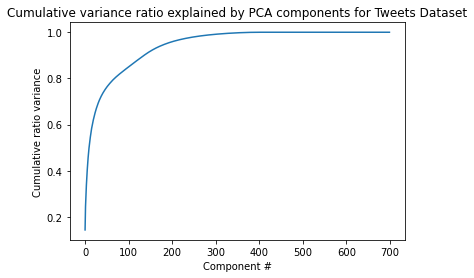

In [5]:
data_pca = PCA().fit(X_scaled)
plt.plot(data_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for Tweets Dataset');

In [6]:
data_pca_x = data_pca.transform(X_scaled)
data_pca_x.shape

(67538, 700)

Text(0.5, 1.0, 'Tweet Data PCA, 24.5% variance explained')

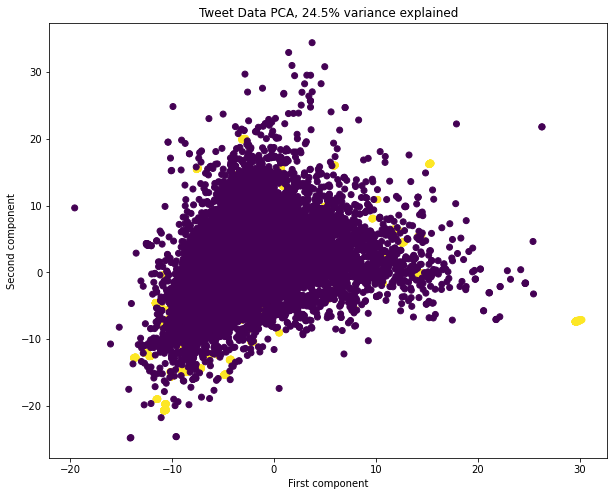

In [7]:
x = data_pca_x[:, 0]
y = data_pca_x[:, 1]
pc_var = 100 * data_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=y1)
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'Tweet Data PCA, {pc_var:.1f}% variance explained')
#for s, x, y in zip(index, x, y):
#    plt.annotate(s, (x, y))

### As you can see above, the data has very little of its variance explained (which probably makes a lot of sense given have much variance there is across multiple doc vectors). The data is also smashed in one place, without much differentiation to speak of visible (you can see the yellow is underneath the purple).
### Below, I tried this process again using just the description vectors and then just the tweet text vectors (and then just the tweet text vectors with retweets removed) with extremely similar results each time. I eventually had to conclude that these vectors are not helpful in visualizing PCA differences between troll and normal tweets.

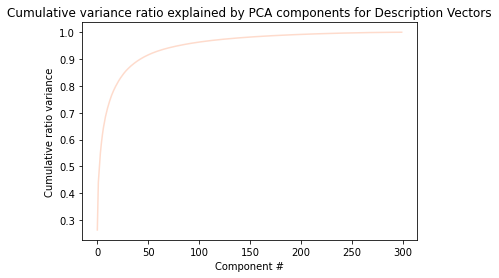

In [8]:
sns.set_palette('Reds')
data_pca = PCA().fit(desc_vecs_df)
plt.plot(data_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for Description Vectors');

In [9]:
data_pca_x = data_pca.transform(desc_vecs_df)
data_pca_x.shape

(67538, 300)

Text(0.5, 1.0, 'Description Vector PCA, 44.1% variance explained')

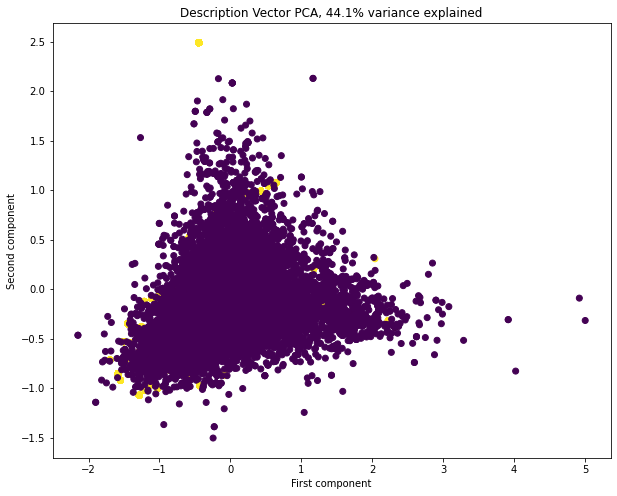

In [10]:
x = data_pca_x[:, 0]
y = data_pca_x[:, 1]
pc_var = 100 * data_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=target)
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'Description Vector PCA, {pc_var:.1f}% variance explained')
#for s, x, y in zip(index, x, y):
#    plt.annotate(s, (x, y))

#Not super helpful

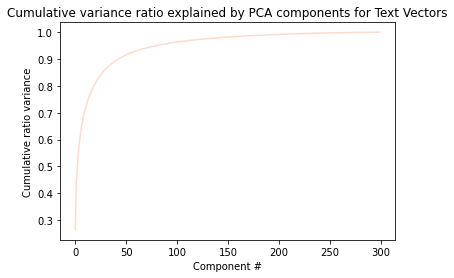

In [11]:
sns.set_palette('Reds')
data_pca = PCA().fit(text_vecs_df)
plt.plot(data_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for Text Vectors');

In [12]:
data_pca_x = data_pca.transform(text_vecs_df)
data_pca_x.shape

(67538, 300)

Text(0.5, 1.0, 'Text Vector PCA, 44.1% variance explained')

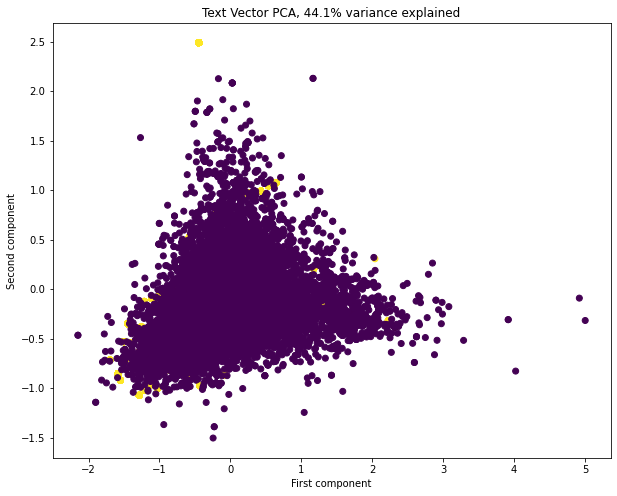

In [13]:
x = data_pca_x[:, 0]
y = data_pca_x[:, 1]
pc_var = 100 * data_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=target)
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'Text Vector PCA, {pc_var:.1f}% variance explained')
#for s, x, y in zip(index, x, y):
#    plt.annotate(s, (x, y))

#Not super helpful

In [14]:
original_tweets = final_tweet_df[['retweeted', 'troll_tweet']]

In [15]:
original_vecs = pd.concat([original_tweets, text_vecs_df], axis=1)

In [16]:
original_vecs = original_vecs[original_vecs['retweeted'] == 0]
original_vecs

,retweeted,troll_tweet,0,1,2,3,4,5,6,7,...,290,291,292,293,294,295,296,297,298,299
0,0,1,-0.072238,0.359071,0.016586,-0.125746,0.253228,0.118856,-0.015107,-0.201646,...,-0.231866,-0.166279,-0.066658,-0.010817,-0.068810,-0.113445,-0.028616,-0.198942,-0.115512,0.155925
1,0,1,-0.044745,0.251391,-0.330337,-0.053548,-0.001278,-0.026183,-0.126361,0.015496,...,-0.245979,0.123282,-0.048576,-0.035306,0.126843,-0.099945,-0.064779,-0.110775,0.261331,0.083833
4,0,1,-0.044745,0.251391,-0.330337,-0.053548,-0.001278,-0.026183,-0.126361,0.015496,...,-0.245979,0.123282,-0.048576,-0.035306,0.126843,-0.099945,-0.064779,-0.110775,0.261331,0.083833
6,0,1,-0.029770,0.267920,-0.043883,-0.318333,-0.015012,0.019224,0.063193,0.060226,...,-0.082504,0.038720,-0.041794,-0.222413,-0.025215,0.137681,0.025396,-0.058168,-0.058537,0.073408
20,0,1,-0.053546,0.243381,-0.090382,-0.063793,0.133108,0.008874,0.041966,-0.186397,...,-0.091870,-0.022239,-0.047047,-0.015713,0.083433,0.089852,0.002152,-0.023883,-0.008350,0.165212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67527,0,0,-0.122169,0.245739,-0.099231,-0.019701,0.053863,0.109073,0.096116,-0.247498,...,0.177670,0.032695,-0.035004,0.162624,0.017040,-0.029300,0.068025,-0.064205,-0.157637,-0.031281
67530,0,0,0.065388,0.143233,0.009503,-0.105021,0.251171,0.073990,0.056614,-0.250373,...,0.022959,-0.078795,0.048288,0.111526,-0.095906,-0.079701,0.150729,-0.073271,-0.165524,-0.064920
67531,0,0,-0.038285,0.191896,0.010775,-0.147118,0.108541,0.082405,-0.059725,-0.006137,...,-0.059101,0.107976,-0.062082,-0.069935,-0.013935,-0.031931,-0.001899,0.040764,-0.214976,-0.020146
67535,0,0,-0.161040,0.202472,-0.072039,-0.005265,0.129319,0.031480,-0.074446,-0.096533,...,-0.083387,-0.028950,-0.083265,0.071764,0.038531,0.049516,-0.036767,-0.137890,-0.047692,0.120318


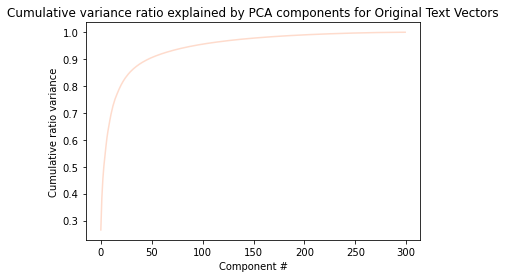

In [17]:
sns.set_palette('Reds')
data_pca = PCA().fit(original_vecs.drop(['retweeted', 'troll_tweet'], axis=1))
plt.plot(data_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for Original Text Vectors');

In [18]:
data_pca_x = data_pca.transform(original_vecs.drop(['retweeted', 'troll_tweet'], axis=1))
data_pca_x.shape

(16759, 300)

Text(0.5, 1.0, 'Original Tweet Vector PCA, 38.4% variance explained')

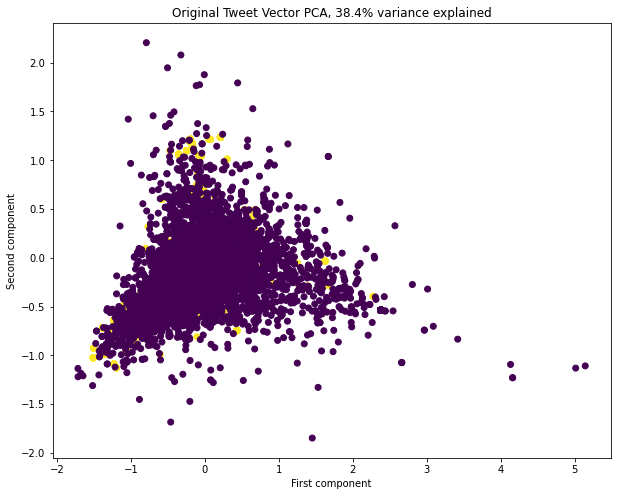

In [19]:
x = data_pca_x[:, 0]
y = data_pca_x[:, 1]
pc_var = 100 * data_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=original_vecs['troll_tweet'])
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'Original Tweet Vector PCA, {pc_var:.1f}% variance explained')
#Oof they're still right not top of each other. That's very disappointing. I imagine it's
#because people mirror each others' manners of speech on twitter. There might be some area to improve on this given
#you CAN see that the purple dots have a lot of outliers around the sides which probably indicate off behavior. But I
#will leave it here for now.

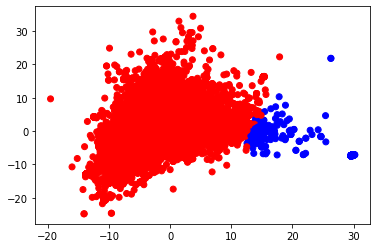

In [20]:
# Make a variable called model. We want n_clusters = 3 as parameter to sklearn.cluster.KMeans 
model = sklearn.cluster.KMeans(n_clusters=2)
# Call a fit_predict() on X 
cluster_assignments = model.fit_predict(X_scaled)

# Let's visualiaze with colors.ListedColormap
cmap = matplotlib.colors.ListedColormap(['red', 'green', 'blue'])

# We're going to do some PCA here. Call decomposition.PCA on sklearn, and pass n_components=2 as parameter
pca = sklearn.decomposition.PCA(n_components=2)
pc1, pc2 = zip(*pca.fit_transform(X_scaled))
plt.scatter(pc1, pc2, c=cluster_assignments.tolist(), cmap=cmap)
#Brutally unhelpful - but similar to the shape I'm getting above. Seems to cluster in the middle with outliers
#around the edges as the primary means of catching anything. Moving on.

Given that the addition of the tweet and description vectors (300 columns each) seemed to yield extremely little or even have a detrimental effect on the dataset, I removed them from the dataset, did a test/train split, and then re-scaled the data in order to perform additional models. (The vectors were also slowing the model down considerably).

In [21]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score, f1_score, accuracy_score,log_loss, auc

#Test train split is performed on the variables before they've been scaled so that X_test can be transformed after the 
#scaler has been fit for X_train (so that the testing data is not a factor, to prevent leakage) 
tweet_data = final_tweet_df.drop(user_cols, axis=1)
tweet_data_columns = tweet_data.columns
X = tweet_data.drop(['troll_tweet'],axis =1)
X_cols = X.columns
y = tweet_data['troll_tweet']
y_col = 'troll_tweet'

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=1)
scaler = StandardScaler().fit(X_train) #Important step to keep the scaling from affecting the results on the test data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

param_grid = {'n_estimators':np.arange(1,500,50)}
rfc = RandomForestClassifier()
rfc_cv= GridSearchCV(rfc,param_grid,cv=5)
rfc_cv.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': array([  1,  51, 101, 151, 201, 251, 301, 351, 401, 451])})

In [22]:
#Below are the best scores achieved by the Random Forest Model, using a Grid Search to find the best parameters:
print("Best Score:" + str(rfc_cv.best_score_))
print("Best Parameters: " + str(rfc_cv.best_params_))

Best Score:0.9995002776235424
Best Parameters: {'n_estimators': 151}


In [25]:
#Below, the Random Forest Classifier is run again with the optimal parameter found above - for visualization purposes
model = RandomForestClassifier(n_estimators=rfc_cv.best_params_)

# Train
model.fit(X_train_scaled, y_train)
# Extract single tree
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_cols,
                class_names = y_col,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook - this is imported at the top
Image(filename = 'tree.png')

Random Forest: Accuracy=0.999
Further Random Forest Metrics:
Balanced accuracy: 0.9989194034127709
Precision score: 0.9996374512825161
Recall score: 0.9994562754870865


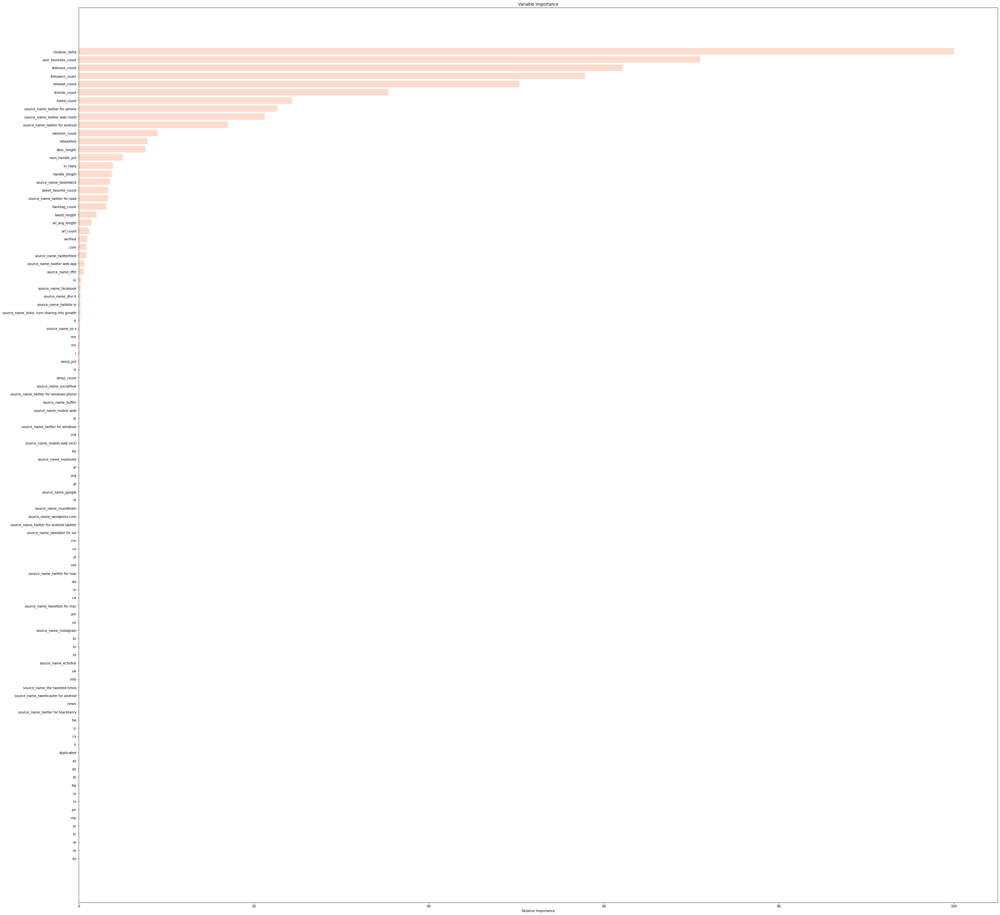

In [27]:
#Metrics for the Random Forest Classifier Model:
#NOTE: The number of recommended estimators changes every time it's run, so this is approximate and subject to change.
from sklearn import tree, metrics
clf = RandomForestClassifier(n_estimators=rfc_cv.best_params_)
model_res = clf.fit(X_train_scaled, y_train)
y_pred = model_res.predict(X_test_scaled)

ac = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
cm = confusion_matrix(y_test, y_pred)

print('Random Forest: Accuracy=%.3f' % (ac))
#print('Random Forest: f1-score=%.3f' % (f1)) - same as accuracy score, above
print('Further Random Forest Metrics:')
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score:' , metrics.precision_score(y_test,y_pred))
print('Recall score:' , metrics.recall_score(y_test,y_pred))

feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())#[:48]
sorted_idx = np.argsort(feature_importance)#[:48]

pos = np.arange(sorted_idx.shape[0]) + .5
#print(pos.size)
sorted_idx.size
plt.figure(figsize=(50,50))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

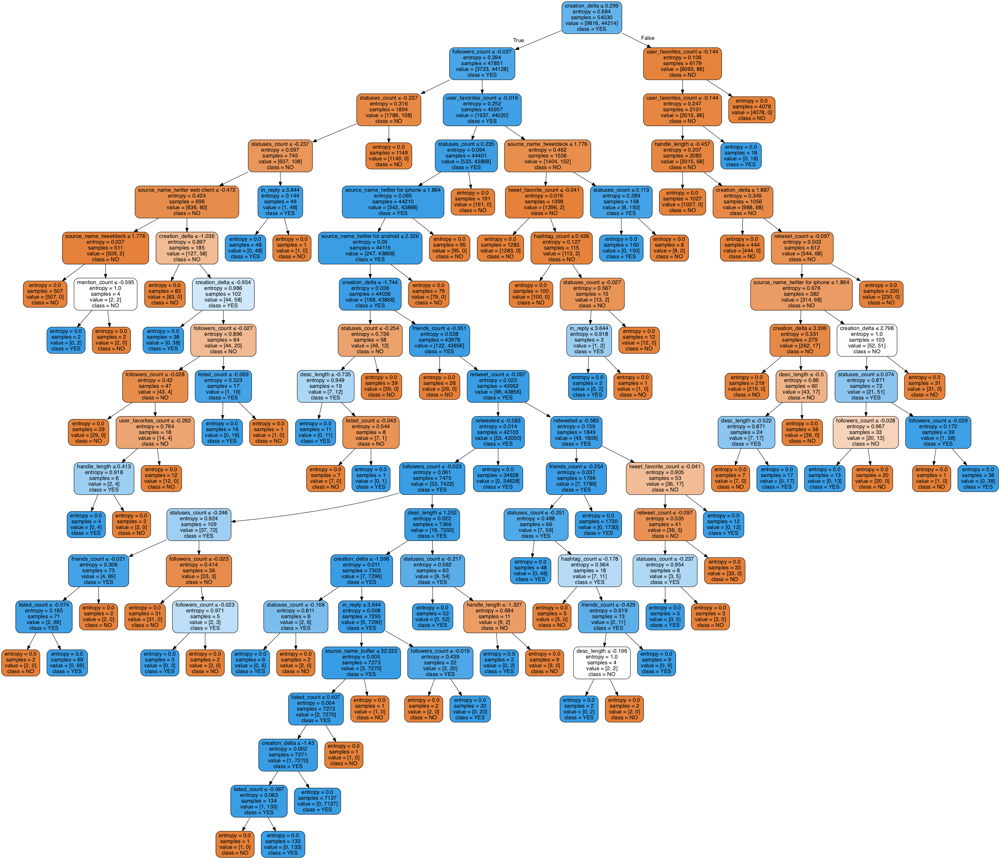

In [28]:
#Below is the Decision tree Classifier Model, using Entropy:
from sklearn import tree, metrics
import seaborn as sns
from io import StringIO  
from IPython.display import Image  
import pydotplus

entr_model = tree.DecisionTreeClassifier(criterion="entropy", random_state = 1234)
entr_model.fit(X_train_scaled, y_train)

y_pred = entr_model.predict(X_test_scaled)

y_pred = pd.Series(y_pred)

dot_data = StringIO()

#Export_graphviz is used to visualize the model:
tree.export_graphviz(entr_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_cols,class_names = ["NO","YES"]) 

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [29]:
#Below, the Metrics for the Entropy Decision Tree Model, based on the prediction compared to the y_test value:
#Note: No Max Depth has been set:
print("Model Entropy - no max depth")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score:' , metrics.precision_score(y_test,y_pred))
print('Recall score:' , metrics.recall_score(y_test,y_pred))

Model Entropy - no max depth
Accuracy: 0.9992596979567664
Balanced accuracy: 0.9984487837929201
Precision score: 0.9993658845909955
Recall score: 0.9997281377435433


In [30]:
#Below, a Gini Decision Tree Model is attempted, and the metrics printed based on its prediction.
gini_model = tree.DecisionTreeClassifier(criterion="gini", random_state = 1234) 
gini_model.fit(X_train_scaled, y_train)

y_pred = gini_model.predict(X_test_scaled)

y_pred = pd.Series(y_pred)

dot_data = StringIO()
tree.export_graphviz(gini_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_cols,class_names = ["NO", "YES"])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
print("Model Gini impurity model")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for:' , metrics.precision_score(y_test,y_pred))
print('Recall score:' , metrics.recall_score(y_test,y_pred))

Model Gini impurity model
Accuracy: 0.998371335504886
Balanced accuracy: 0.9963363272138369
Precision score for: 0.9984611206662443
Recall score: 0.9995468962392388


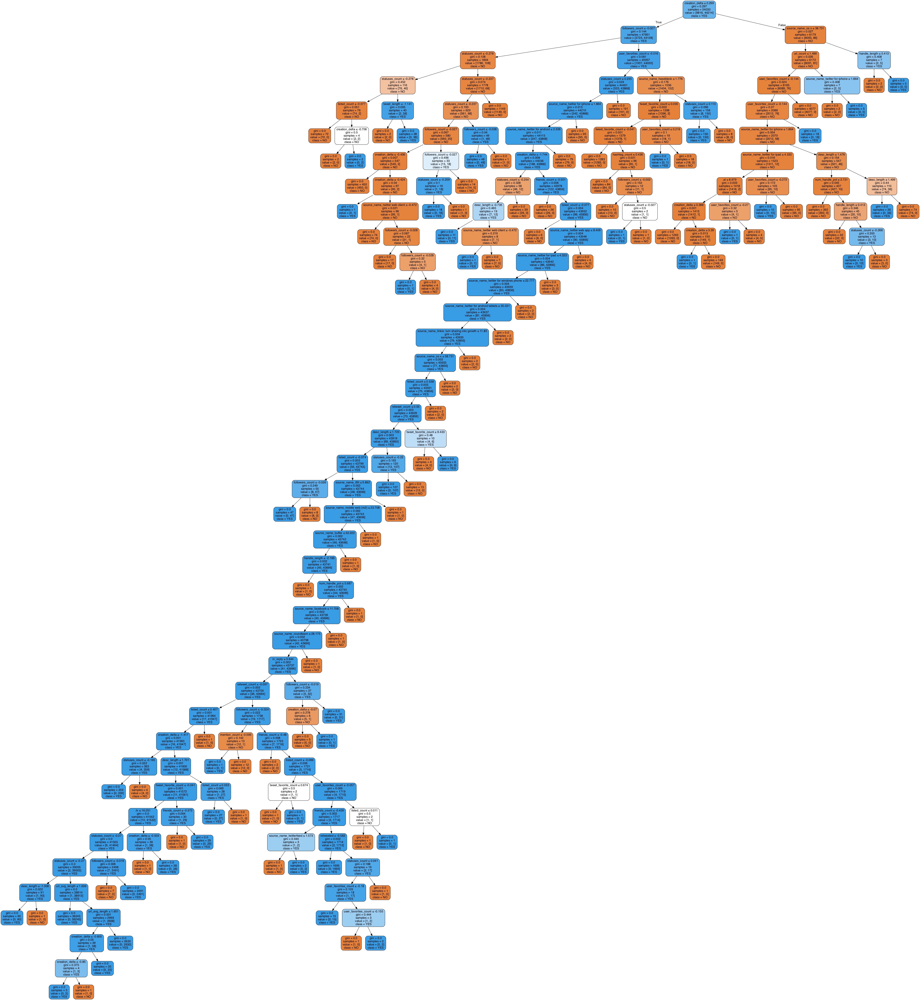

In [31]:
#The gini model is graphed below.
Image(graph.create_png())

In [32]:
#Gradient Boosting:
from sklearn.ensemble import GradientBoostingClassifier
learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1]
for learning_rate in learning_rates:
    gb = GradientBoostingClassifier(n_estimators=20, learning_rate = learning_rate, max_features=2, max_depth = 2, random_state = 0)
    gb.fit(X_train_scaled, y_train)
    
gb = GradientBoostingClassifier(n_estimators=20, learning_rate = 1, max_features=2, max_depth = 2, random_state = 0)
gb.fit(X_train_scaled, y_train)
y_pred = gb.predict(X_test_scaled)
print("Confusion matrix: ", confusion_matrix(y_test, y_pred))
print("Classification report: ", classification_report(y_test, y_pred))

y_scores_gb = gb.decision_function(X_test_scaled)
fpr_gb, tpr_gb, _ = roc_curve(y_test, y_scores_gb)
roc_auc_gb = auc(fpr_gb, tpr_gb)
print("Area under ROC: ", roc_auc_gb)

Confusion matrix:  [[ 2283   190]
 [   79 10956]]
Classification report:                precision    recall  f1-score   support

           0       0.97      0.92      0.94      2473
           1       0.98      0.99      0.99     11035

    accuracy                           0.98     13508
   macro avg       0.97      0.96      0.97     13508
weighted avg       0.98      0.98      0.98     13508

Area under ROC:  0.9936139852775172


In [33]:
print("Gradient Boosting Model:")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score' , metrics.precision_score(y_test,y_pred))
print('Recall score' , metrics.recall_score(y_test,y_pred))

Gradient Boosting Model:
Accuracy: 0.980085875037015
Balanced accuracy: 0.9580055995783002
Precision score 0.9829535259285842
Recall score 0.9928409605799728


In [34]:
#Finally, a Baysian model:
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder
import lightgbm
from bayes_opt import BayesianOptimization
from catboost import CatBoostClassifier, cv, Pool
import os
def lgb_eval(num_leaves,max_depth,lambda_l2,lambda_l1,min_child_samples, min_data_in_leaf):
    params = {
        "objective" : "binary",
        "metric" : "auc", 
        'is_unbalance': True,
        "num_leaves" : int(num_leaves),
        "max_depth" : int(max_depth),
        "lambda_l2" : lambda_l2,
        "lambda_l1" : lambda_l1,
        "num_threads" : 20,
        "min_child_samples" : int(min_child_samples),
        'min_data_in_leaf': int(min_data_in_leaf),
        "learning_rate" : 0.03,
        "subsample_freq" : 5,
        "bagging_seed" : 42,
        "verbosity" : -1
    }
    lgtrain = lightgbm.Dataset(X_train_scaled, y_train)
    cv_result = lightgbm.cv(params,
                       lgtrain,
                       1000,
                       early_stopping_rounds=100,
                       stratified=True,
                       nfold=3)
    return cv_result['auc-mean'][-1]

lgbBO = BayesianOptimization(lgb_eval, {'num_leaves': (25, 4000),
                                                'max_depth': (5, 63),
                                                'lambda_l2': (0.0, 0.05),
                                                'lambda_l1': (0.0, 0.05),
                                                'min_child_samples': (50, 10000),
                                                'min_data_in_leaf': (100, 2000)
                                                })

lgbBO.maximize(n_iter=10, init_points=2)

|   iter    |  target   | lambda_l1 | lambda_l2 | max_depth | min_ch... | min_da... | num_le... |
-------------------------------------------------------------------------------------------------
[LightGBM] [Warning] min_data_in_leaf is set=1293, min_child_samples=1050 will be ignored. Current value: min_data_in_leaf=1293
|  1        |  1.0      |  0.03761  |  0.0449   |  6.546    |  1.051e+0 |  1.293e+0 |  781.1    |
|  2        |  1.0      |  0.01989  |  0.03311  |  9.092    |  7.283e+0 |  1.097e+0 |  827.7    |
|  3        |  1.0      |  0.03197  |  0.04711  |  9.072    |  6.571e+0 |  541.9    |  991.1    |
|  4        |  1.0      |  0.006228 |  0.03782  |  62.92    |  91.81    |  1.769e+0 |  100.0    |
|  5        |  1.0      |  0.01913  |  0.03485  |  13.89    |  8.793e+0 |  793.7    |  963.9    |
|  6        |  1.0      |  0.02873  |  0.01747  |  49.51    |  8.036e+0 |  412.2    |  2.182e+0 |
|  7        |  1.0      |  0.008284 |  0.03079  |  21.27    |  1.167e+0 |  1.422e+0 |  2

In [35]:
print(lgbBO.max)
params = lgbBO.max['params']
#The 'target' value is effectively grading the performance of the model, not telling us
#the model metrics here. For that, we need to run the lgbm model using the found parameters (as was done above for KNN
#and Random Forest after the grid searches).

{'target': 0.9999979885006941, 'params': {'lambda_l1': 0.02672491217975094, 'lambda_l2': 0.026643296394063765, 'max_depth': 43.588507656349144, 'min_child_samples': 7394.335325553565, 'min_data_in_leaf': 471.23017554512774, 'num_leaves': 2306.009619393001}}


In [36]:
#Using these parameters to find more precise metrics for the lgb model:
train_data = lightgbm.Dataset(X_train_scaled, label=y_train)
test_data = lightgbm.Dataset(X_test_scaled, label=y_test)
params['num_leaves'] = int(params['num_leaves'])
params['max_depth'] = int(params['max_depth'])
params['min_data_in_leaf'] = int(params['min_data_in_leaf'])
params['application'] = 'binary'
params['objective'] = 'binary'
params['metric'] = 'auc'
params['is_unbalance'] = True
params['num_threads'] = 20
params['learning_rate'] = 0.03
params['subsample_freq'] = 5
params['bagging_seed'] = 42
params['verbosity'] = -1
#print(params)
model = lightgbm.train(params,
                       train_data,
                       valid_sets=test_data,
                       num_boost_round=5000,
                       early_stopping_rounds=100)
model.save_model('model.txt')
#Scroll all the way down to see the results.

[1]	valid_0's auc: 0.99837
Training until validation scores don't improve for 100 rounds
[2]	valid_0's auc: 0.998355
[3]	valid_0's auc: 0.998726
[4]	valid_0's auc: 0.998812
[5]	valid_0's auc: 0.998851
[6]	valid_0's auc: 0.998891
[7]	valid_0's auc: 0.998936
[8]	valid_0's auc: 0.999043
[9]	valid_0's auc: 0.999064
[10]	valid_0's auc: 0.999065
[11]	valid_0's auc: 0.999156
[12]	valid_0's auc: 0.999217
[13]	valid_0's auc: 0.999241
[14]	valid_0's auc: 0.999262
[15]	valid_0's auc: 0.999289
[16]	valid_0's auc: 0.999297
[17]	valid_0's auc: 0.999292
[18]	valid_0's auc: 0.999301
[19]	valid_0's auc: 0.999315
[20]	valid_0's auc: 0.99932
[21]	valid_0's auc: 0.99932
[22]	valid_0's auc: 0.99933
[23]	valid_0's auc: 0.99933
[24]	valid_0's auc: 0.999318
[25]	valid_0's auc: 0.999304
[26]	valid_0's auc: 0.999313
[27]	valid_0's auc: 0.999327
[28]	valid_0's auc: 0.999312
[29]	valid_0's auc: 0.999316
[30]	valid_0's auc: 0.999289
[31]	valid_0's auc: 0.9993
[32]	valid_0's auc: 0.999304
[33]	valid_0's auc: 0.9993

[291]	valid_0's auc: 0.999997
[292]	valid_0's auc: 0.999997
[293]	valid_0's auc: 0.999997
[294]	valid_0's auc: 0.999997
[295]	valid_0's auc: 0.999997
[296]	valid_0's auc: 0.999997
[297]	valid_0's auc: 0.999997
[298]	valid_0's auc: 0.999997
[299]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999997
[301]	valid_0's auc: 0.999997
[302]	valid_0's auc: 0.999997
[303]	valid_0's auc: 0.999997
[304]	valid_0's auc: 0.999997
[305]	valid_0's auc: 0.999997
[306]	valid_0's auc: 0.999997
[307]	valid_0's auc: 0.999997
[308]	valid_0's auc: 0.999997
[309]	valid_0's auc: 0.999997
[310]	valid_0's auc: 0.999997
[311]	valid_0's auc: 0.999997
[312]	valid_0's auc: 0.999997
[313]	valid_0's auc: 0.999997
[314]	valid_0's auc: 0.999997
[315]	valid_0's auc: 0.999997
[316]	valid_0's auc: 0.999997
[317]	valid_0's auc: 0.999997
[318]	valid_0's auc: 0.999997
[319]	valid_0's auc: 0.999997
[320]	valid_0's auc: 0.999997
[321]	valid_0's auc: 0.999997
[322]	valid_0's auc: 0.999997
[323]	valid_0's auc: 0.999997
[324]	vali

In [37]:
y_pred = model.predict(X_test_scaled, num_iteration=model.best_iteration)
y_pred = y_pred.round(0)

In [38]:
print("Light GBM with Bayesian Parameter Tuning:")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score' , metrics.precision_score(y_test,y_pred))
print('Recall score' , metrics.recall_score(y_test,y_pred))

Light GBM with Bayesian Parameter Tuning:
Accuracy: 0.9995558187740599
Balanced accuracy: 0.9994143913303093
Precision score 0.9998187256412581
Recall score 0.999637516991391
